# Scanpy preprocessing

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import scirpy as ir
import scrublet as scr
import seaborn as sb
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import rc_context

from glob import glob
import tarfile
import anndata
import warnings

sc.settings.verbosity = 0  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map='OrRd')
sc.logging.print_header()

scanpy==1.8.2 anndata==0.8.0 umap==0.5.3 numpy==1.21.1 scipy==1.7.0 pandas==1.5.3 scikit-learn==0.24.2 statsmodels==0.12.2 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


### Functions for calculating doublet scores with Scrublet pipeline

For the next step, we would need the expected doublet formation rate. These values can be found [here](https://uofuhealth.utah.edu/huntsman/shared-resources/gba/htg/single-cell/genomics-10x.php). Since our dataset has approximately 10,000 (recovered) cells, we take the highest value given in the table.<br>
Expected_doublet_rate = 0.076

In [2]:
# from https://github.com/Teichlab/mapcloud/blob/master/scripts/starsolo/postprocess.py
from statsmodels.stats.multitest import multipletests
import scrublet as scr
import scanpy as sc
import pandas as pd
import numpy as np
import scipy

# Credits to Krzysztof Polanski and Ni Huang
#some functions that Ni uses in scanpy scripts to run scrublet
#which in turn are inspired by Krzysztof original notebook on the matter
#(extracted from scanpy_scripts 0.2.10 to get around scanpy version incompatibility)

def test_outlier(x, upper_mad_only=True):
	med = np.median(x)
	if upper_mad_only:
		mad = np.median(x[x>med] - med) * 1.4826
	else:
		mad = np.median(np.abs(x - med)) * 1.4826
	pvals = 1 - scipy.stats.norm.cdf(x, loc=med, scale=mad)
	bh_pvals = multipletests(pvals, method='fdr_bh')[1]
	return pvals, bh_pvals

def run_scrublet(adata, resolution_function=None):
    old_verbosity = sc.settings.verbosity
    sc.settings.verbosity = 1
    if resolution_function is None:
        resolution_function = lambda x: np.maximum(np.maximum(np.log10(x)-1, 0)**2, 0.1)
    scrub = scr.Scrublet(adata.X)
    #this has the potential to brick for poor quality data
    #if so, abort it and everything downstream
    try:
        ds, pd = scrub.scrub_doublets(verbose=False)
    except:
        return
    adata.obs['scrublet_score'] = ds

    adata_copy = adata.copy()
    sc.pp.filter_genes(adata_copy, min_cells=3)
    sc.pp.normalize_total(adata_copy, target_sum=1e4)
    sc.pp.log1p(adata_copy)
    sc.pp.highly_variable_genes(adata_copy, min_mean=0.0125, max_mean=3, min_disp=0.5, subset=True)
    sc.pp.scale(adata_copy, zero_center=False)
    sc.pp.pca(adata_copy, svd_solver='arpack', zero_center=False)
    sc.pp.neighbors(adata_copy, n_pcs=30)
    sc.tl.umap(adata_copy)
    sc.tl.leiden(adata_copy, resolution=1)
    for clst in np.unique(adata_copy.obs['leiden']):
        clst_size = sum(adata_copy.obs['leiden'] == clst)
        sc.tl.leiden(adata_copy, restrict_to=('leiden', [clst]), resolution=resolution_function(clst_size), key_added='leiden_R')
        adata_copy.obs['leiden'] = adata_copy.obs['leiden_R']
    clst_meds = []
    for clst in np.unique(adata_copy.obs['leiden']):
        k = adata_copy.obs['leiden'] == clst
        clst_med = np.median(adata_copy.obs.loc[k, 'scrublet_score'])
        adata_copy.obs.loc[k, 'cluster_scrublet_score'] = clst_med
        clst_meds.append(clst_med)
    clst_meds = np.array(clst_meds)
    pvals, bh_pvals = test_outlier(clst_meds)
    for i, clst in enumerate(np.unique(adata_copy.obs['leiden'])):
        k = adata_copy.obs['leiden'] == clst
        adata_copy.obs.loc[k, 'pval'] = pvals[i]
        adata_copy.obs.loc[k, 'bh_pval'] = bh_pvals[i]
    sc.settings.verbosity = old_verbosity
    #need to also export the clustering, for soupx purposes
    adata.obs['scrublet_leiden'] = adata_copy.obs['leiden']
    adata.obs['scrublet_score'] = adata_copy.obs['scrublet_score']
    adata.obs['cluster_scrublet_score'] = adata_copy.obs['cluster_scrublet_score']
    adata.obs['doublet_pval'] = adata_copy.obs['pval']
    adata.obs['doublet_bh_pval'] = adata_copy.obs['bh_pval']
    del adata_copy

Thresholding  ```bh_pval```  **smaller than 0.05**, for doublet calling

## 1. Basic quality control and filtering.

In [5]:
# define sample metadata.  Here we just define the gut locations.

samples = {
    "crout1": {"location": "MLN"},
    "crout2": {"location": "CP"},
    "crout3": {"location": "LA"},
    "crout4": {"location": "LP"},
}


In [6]:
# Create a list of AnnData objects (one for each sample)
adatas = []
for sample, sample_meta in samples.items():
    gex_file = '/nfs/team205/rb29/mice_gutTCRtg_project/data/soupx/'+sample+'_soupx_out/'
    tcr_file = '/lustre/scratch127/cellgen/cellgeni/tickets/tic-1097/'+sample+'/outs/per_sample_outs/'+sample+'/vdj_t/filtered_contig_annotations.csv'
    adata = sc.read_10x_mtx(gex_file, cache = True, make_unique = True)
    adata_tcr = ir.io.read_10x_vdj(tcr_file)
    ir.pp.merge_with_ir(adata, adata_tcr)
    adata.obs["sample"] = sample
    adata.obs["location"] = sample_meta["location"]
    # concatenation only works with unique gene names
    adata.var_names_make_unique()
    #Run Scrublet for each run:
    run_scrublet(adata)
    #adata.obs_names = [sample+'_'+i for i in adata.obs_names]
    adatas.append(adata)


/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/scirpy/io/_convert_anndata.py:81: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(obs=ir_df, X=np.empty([ir_df.shape[0], 0]))
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/scirpy/io/_convert_anndata.py:81: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  adata = AnnData(obs=ir_df, X=np.empty([ir_df.shape[0], 0]))
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/scirpy/io/_convert_anndata.py:81: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of ann

In [7]:
# Merge anndata objects
adata = adatas[0].concatenate(adatas[1:])

/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  [AnnData(sparse.csr_matrix(a.shape), obs=a.obs) for a in all_adatas],
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/anndata/_core/anndata.py:1785: FutureWarning: X.dtype being converted to np.float32 from float64. In the next ver

In [8]:
adata.obs_names_make_unique()

In [9]:
adata.shape

(17239, 32285)

In [10]:
# make sure all gene names are unique
adata.var_names_make_unique()

In [11]:
adata.obs.head()

,is_cell,high_confidence,multi_chain,extra_chains,IR_VJ_1_c_call,IR_VJ_2_c_call,IR_VDJ_1_c_call,IR_VDJ_2_c_call,IR_VJ_1_consensus_count,IR_VJ_2_consensus_count,...,IR_VDJ_2_v_call,has_ir,sample,location,scrublet_score,scrublet_leiden,cluster_scrublet_score,doublet_pval,doublet_bh_pval,batch
AAACCTGAGCCCAATT-1-0,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None,crout1,MLN,0.099062,"6,6",0.114416,0.254833,0.928629,0
AAACCTGAGCCGTCGT-1-0,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None,crout1,MLN,0.060870,"1,16",0.077338,0.613576,0.959180,0
AAACCTGAGCGTTGCC-1-0,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None,crout1,MLN,0.185784,"9,0",0.125152,0.175194,0.918716,0
AAACCTGAGGATTCGG-1-0,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None,crout1,MLN,0.081633,"18,2",0.106511,0.323752,0.947505,0
AAACCTGAGGTGATTA-1-0,None,None,None,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,None,crout1,MLN,0.065898,"25,0",0.104865,0.339018,0.947505,0


## Basic filtering

In [12]:
adata.var['mt'] = adata.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
adata.var['rb'] = adata.var_names.str.startswith(('Rps','Rpl'))  # annotate the group of ribosomal proteins as 'rb'
sc.pp.calculate_qc_metrics(adata, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)
sc.pp.calculate_qc_metrics(adata, qc_vars=['rb'], percent_top=None, log1p=False, inplace=True)

### Immunoglobuling genes

In [13]:
Ig_genes = [x.strip() for x in open('/home/jovyan/Miscelanea/Gene_lists/Ig_genes_mouse.txt')]
IGgenes = [x for x in Ig_genes if x in adata.var_names]
print(IGgenes)

['Igha', 'Ighd', 'Ighd1-1', 'Ighd2-3', 'Ighd2-4', 'Ighd2-5', 'Ighd2-6', 'Ighd2-7', 'Ighd2-8', 'Ighd3-1', 'Ighd3-2', 'Ighd4-1', 'Ighe', 'Ighg1', 'Ighg3', 'Ighj1', 'Ighj2', 'Ighj3', 'Ighj4', 'Ighm', 'Ighv1-11', 'Ighv1-12', 'Ighv1-15', 'Ighv1-18', 'Ighv1-19', 'Ighv1-20', 'Ighv1-22', 'Ighv1-26', 'Ighv1-31', 'Ighv1-34', 'Ighv1-36', 'Ighv1-37', 'Ighv1-39', 'Ighv1-4', 'Ighv1-42', 'Ighv1-43', 'Ighv1-47', 'Ighv1-49', 'Ighv1-5', 'Ighv1-50', 'Ighv1-52', 'Ighv1-53', 'Ighv1-54', 'Ighv1-55', 'Ighv1-56', 'Ighv1-58', 'Ighv1-59', 'Ighv1-61', 'Ighv1-62-1', 'Ighv1-62-2', 'Ighv1-62-3', 'Ighv1-63', 'Ighv1-64', 'Ighv1-66', 'Ighv1-69', 'Ighv1-7', 'Ighv1-71', 'Ighv1-72', 'Ighv1-74', 'Ighv1-75', 'Ighv1-76', 'Ighv1-77', 'Ighv1-78', 'Ighv1-80', 'Ighv1-81', 'Ighv1-82', 'Ighv1-84', 'Ighv1-85', 'Ighv1-9', 'Ighv10-1', 'Ighv10-3', 'Ighv11-1', 'Ighv11-2', 'Ighv12-3', 'Ighv13-2', 'Ighv14-1', 'Ighv14-2', 'Ighv14-3', 'Ighv14-4', 'Ighv15-2', 'Ighv2-2', 'Ighv2-3', 'Ighv2-4', 'Ighv2-5', 'Ighv2-6', 'Ighv2-6-8', 'Ighv2-7', 'I

In [14]:
Rb_genes = [x.strip() for x in open('/home/jovyan/Miscelanea/Gene_lists/Mouse_Rb_proteins_geneList_ribosome.med.miyazaki-u.ac.jp.txt')]
RBgenes = [x for x in Rb_genes if x in adata.var_names]
print(RBgenes)

['Rpsa', 'Rps2', 'Rps3', 'Rps4x', 'Rps5', 'Rps6', 'Rps7', 'Rps8', 'Rps9', 'Rps10', 'Rps11', 'Rps12', 'Rps13', 'Rps14', 'Rps15', 'Rps15a', 'Rps16', 'Rps17', 'Rps18', 'Rps19', 'Rps20', 'Rps21', 'Rps23', 'Rps24', 'Rps25', 'Rps26', 'Rps27', 'Rps27a', 'Rps28', 'Rps29', 'Rpl3', 'Rpl4', 'Rpl5', 'Rpl6', 'Rpl7', 'Rpl7a', 'Rpl8', 'Rpl9', 'Rpl10', 'Rpl10a', 'Rpl11', 'Rpl12', 'Rpl13', 'Rpl13a', 'Rpl14', 'Rpl15', 'Rpl17', 'Rpl18', 'Rpl18a', 'Rpl19', 'Rpl21', 'Rpl22', 'Rpl23', 'Rpl23a', 'Rpl24', 'Rpl26', 'Rpl27', 'Rpl27a', 'Rpl28', 'Rpl29', 'Rpl30', 'Rpl31', 'Rpl32', 'Rpl34', 'Rpl35', 'Rpl35a', 'Rpl36', 'Rpl37', 'Rpl37a', 'Rpl38', 'Rpl39', 'Rpl41', 'Rplp0', 'Rplp1', 'Rplp2']


In [15]:
#Compute these measures
adata.obs['percent_Ig'] = np.sum(
    adata[:, IGgenes].X, axis=1).A1 / np.sum(adata.X, axis=1).A1

A violin plot of the computed quality measures can help us analyze the dataset in general and make decisions about cutoffs.

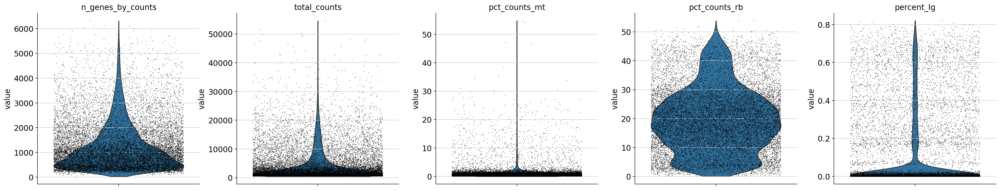

In [16]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb','percent_Ig'], 
             jitter=0.4, multi_panel=True)

In [17]:
adata.uns["location_colors"]=['#ff7f0e','#279e68', '#d62728', '#1f77b4']

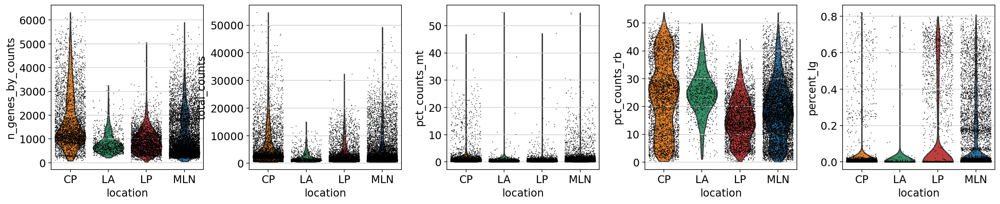

In [18]:
sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb','percent_Ig'], 
             jitter=0.4, multi_panel=True, groupby='location')

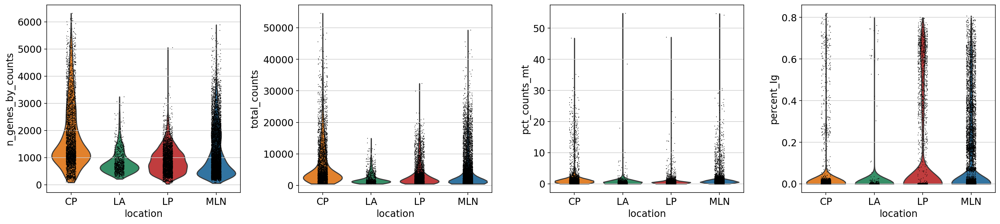

In [19]:
with mpl.rc_context({'figure.figsize': (5, 5)}):
    sc.pl.violin(adata, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','percent_Ig'], groupby='location', save='QC.jpg')

/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


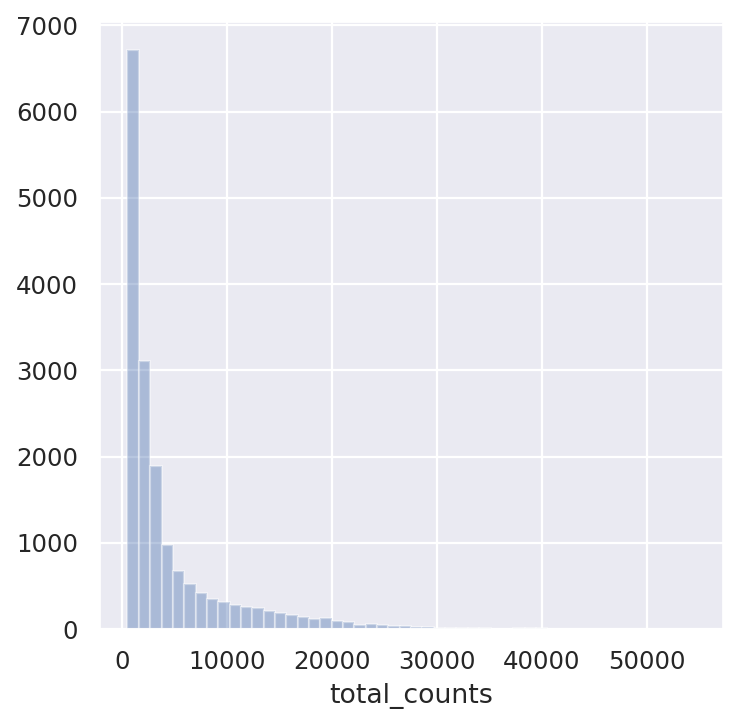

In [20]:
#Thresholding decision: counts
sb.set(rc={'figure.figsize':(5,5)})
p3 = sb.distplot(adata.obs['total_counts'], kde=False)

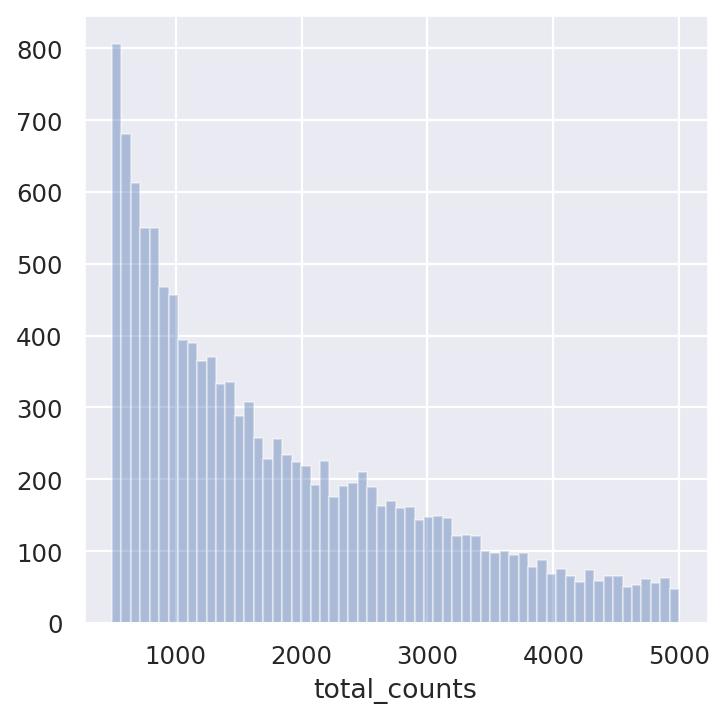

In [21]:
p4 = sb.distplot(adata.obs['total_counts'][adata.obs['total_counts']<5000], kde=False, bins=60)

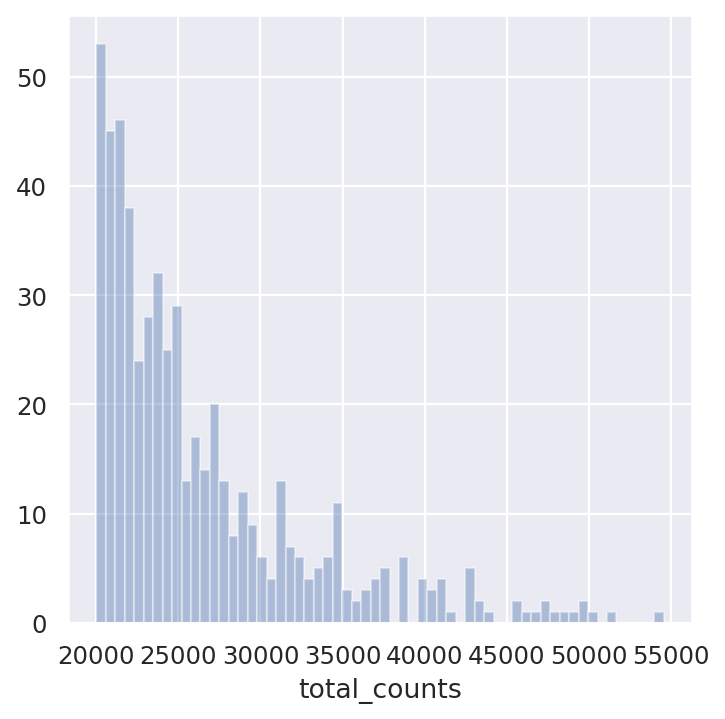

In [22]:
p5 = sb.distplot(adata.obs['total_counts'][adata.obs['total_counts']>20000], kde=False, bins=60)

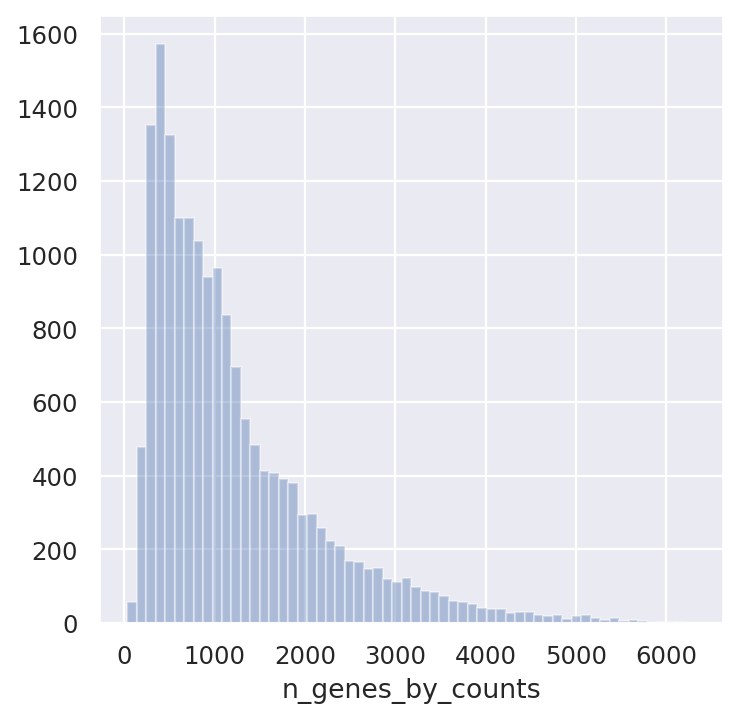

In [23]:
#Thresholding decision: genes
sb.set(rc={'figure.figsize':(5,5)})
p6 = sb.distplot(adata.obs['n_genes_by_counts'], kde=False, bins=60)

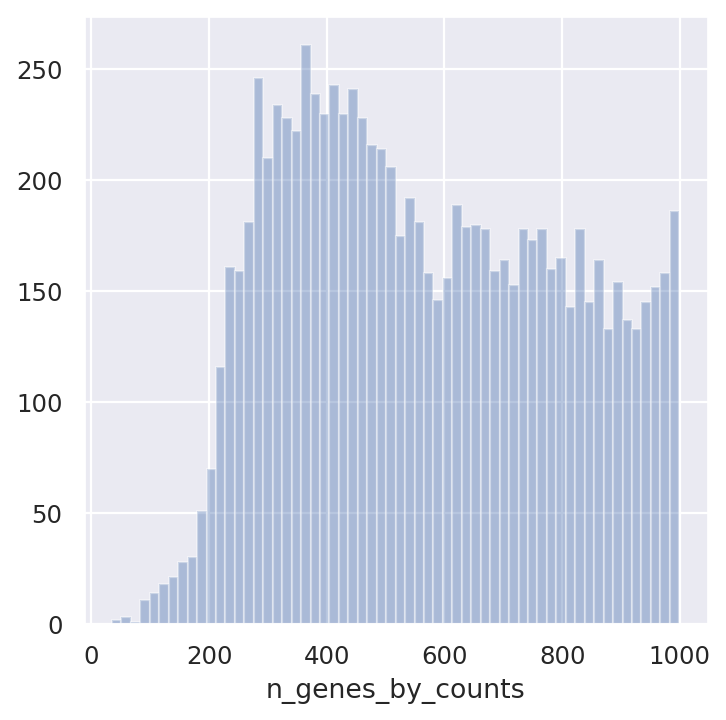

In [24]:
p7 = sb.distplot(adata.obs['n_genes_by_counts'][adata.obs['n_genes_by_counts']<1000], kde=False, bins=60)

Let's remove all genes expressed in fewer than 3 cells:

In [25]:
sc.pp.filter_genes(adata, min_cells=3)
adata

AnnData object with n_obs × n_vars = 17239 × 19330
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample', 'locati

Plot correlations and make sure that high mitochondrial content corresponds with low total counts (dead cells), and that total counts have strong positive correlation with the number of expressed genes:

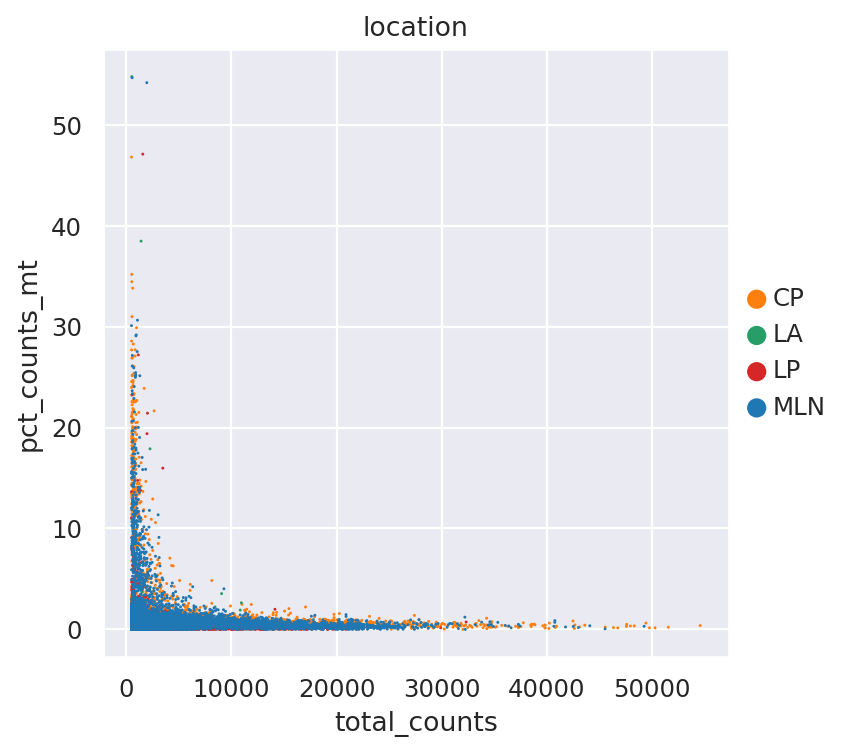

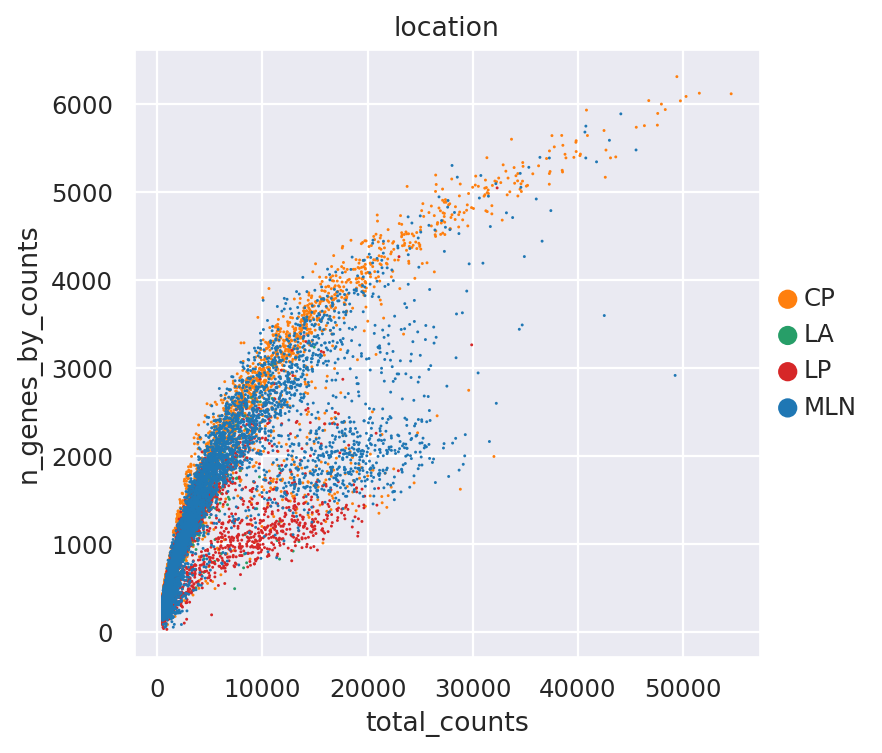

In [26]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_mt', color= 'location')#color="location"
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',color='location')

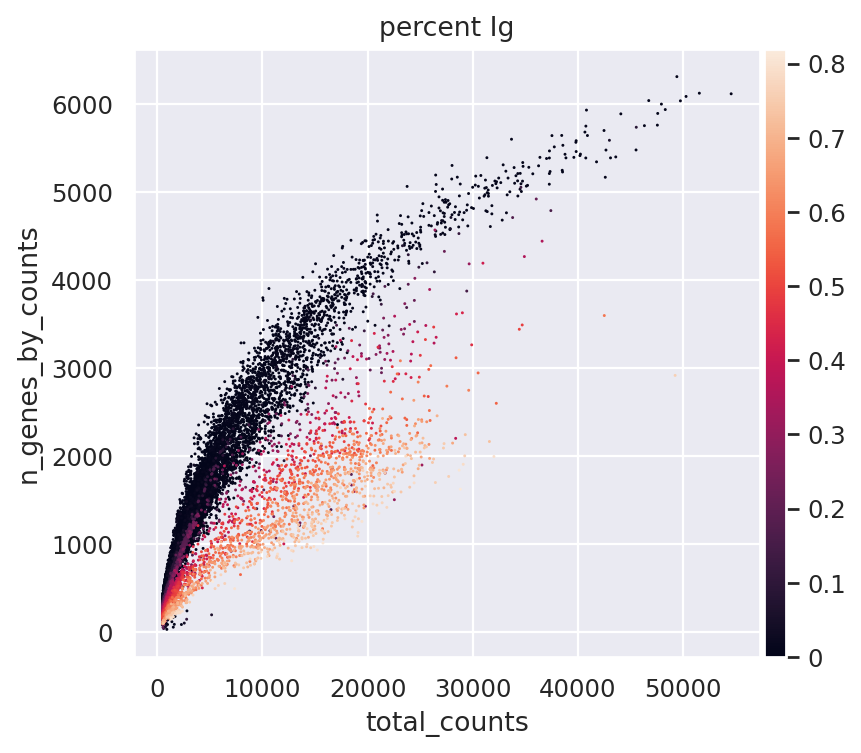

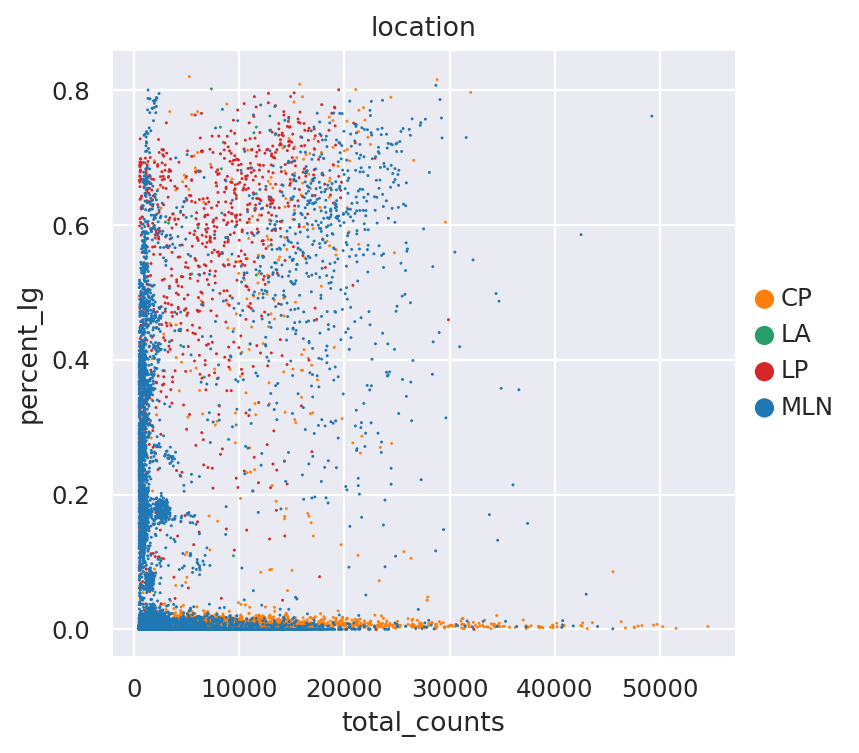

In [27]:
sc.pl.scatter(adata, x='total_counts', y='n_genes_by_counts',color='percent_Ig')
sc.pl.scatter(adata, x='total_counts', y='percent_Ig',color="location")

In [28]:
adata.uns['location_colors']

array(['#ff7f0e', '#279e68', '#d62728', '#1f77b4'], dtype='<U7')

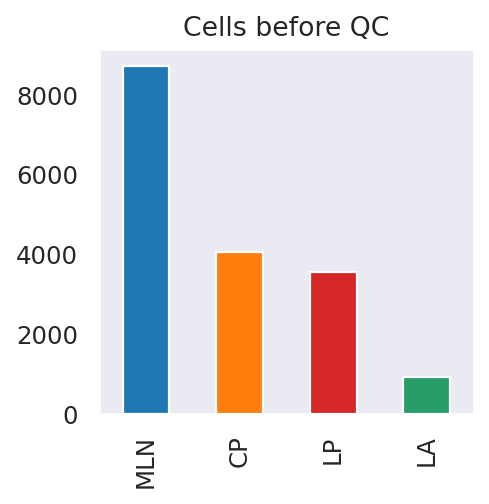

In [29]:
with mpl.rc_context({'font.size': 8, 'figure.figsize': (5, 5)}):
    adata.obs['location'].value_counts().plot(kind='bar',color=['#1f77b4', '#ff7f0e', '#d62728','#279e68'] ,
                                              title="Cells before QC", figsize=(3,3),width=0.5, grid=False)
    plt.savefig("Cells_before_QC.pdf")
    plt.show()

In [30]:
adata.obs['location'].value_counts()

MLN    8710
CP     4053
LP     3545
LA      931
Name: location, dtype: int64

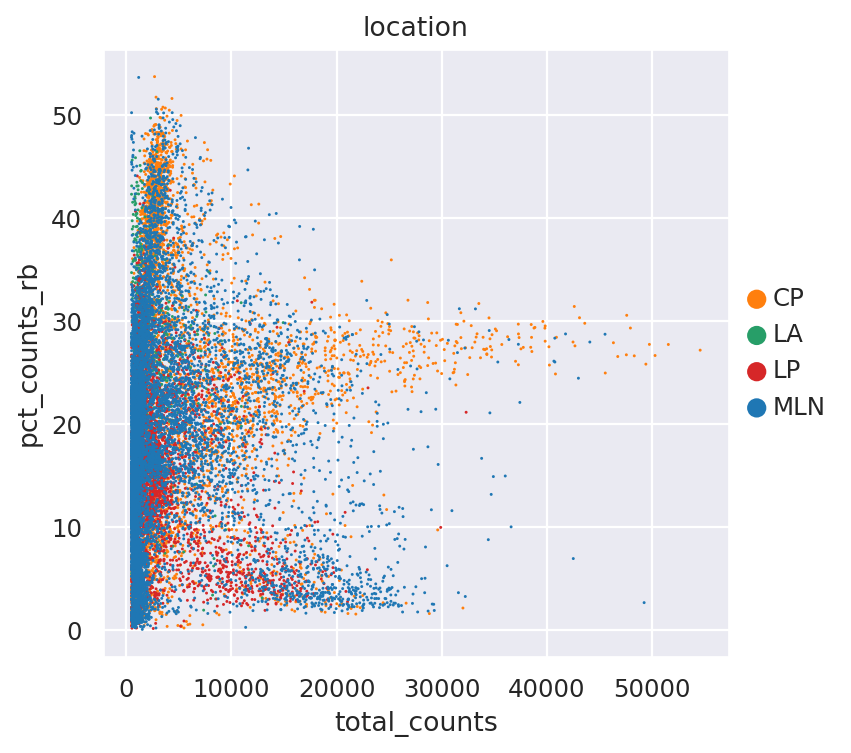

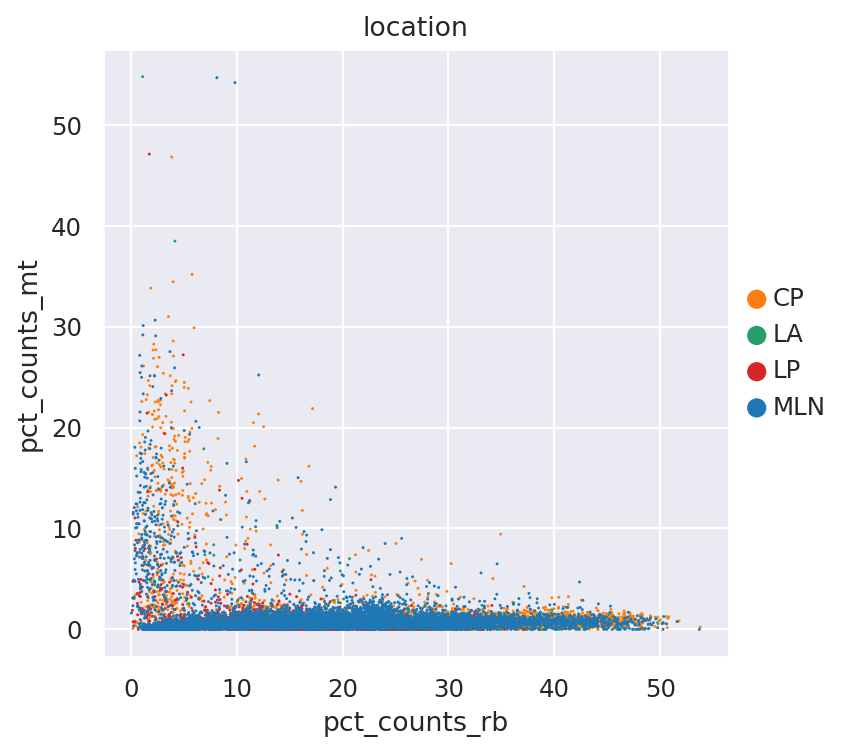

In [31]:
sc.pl.scatter(adata, x='total_counts', y='pct_counts_rb',color="location")
sc.pl.scatter(adata, x='pct_counts_rb', y='pct_counts_mt',color="location")

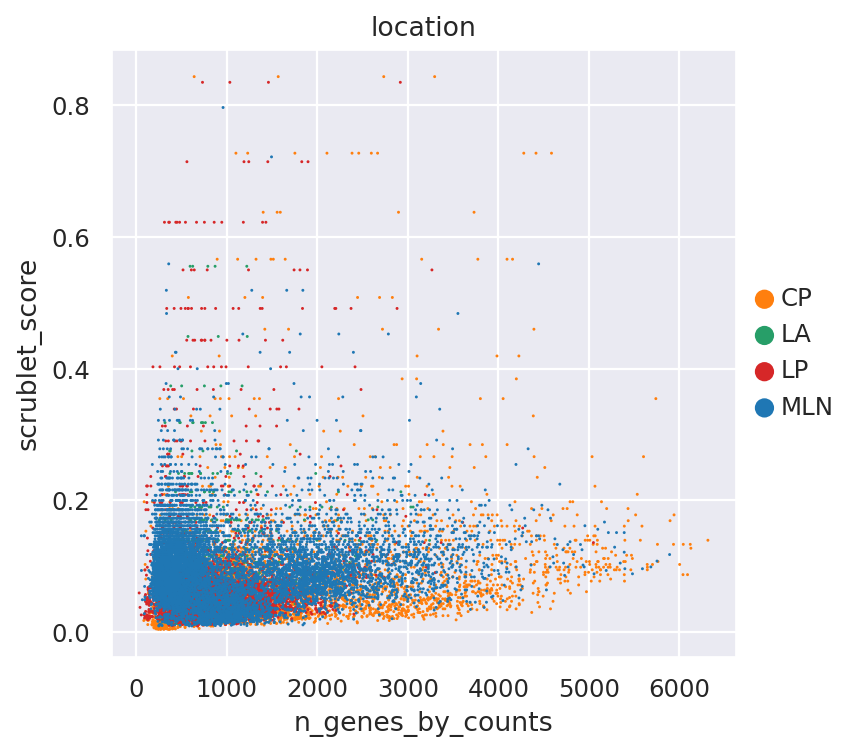

In [32]:
sc.pl.scatter(adata, x='n_genes_by_counts', y='scrublet_score',color="location")

### Setting values for QC

In [33]:
adata.obs["predicted_doublets"] =  np.where(adata.obs["doublet_bh_pval"]<0.05 , True, False)

In [34]:
adata.obs["predicted_doublets"].value_counts()

False    16978
True       261
Name: predicted_doublets, dtype: int64

In [35]:
conditions = [
    (adata.obs['predicted_doublets'] == True),
    (adata.obs['n_genes_by_counts'] < 600),#Normally it would be 500, Filter out cells with less than 600 gens
    (adata.obs['total_counts'] < 1000),#Filter out cells with less than 1000 umi counts
    (adata.obs['pct_counts_mt'] > 15),#Normally it would be 20 - 15%
    (adata.obs['pct_counts_mt'] <= 15) & (adata.obs['n_genes_by_counts'] >= 600) & (adata.obs['total_counts'] >= 1000) & (adata.obs['predicted_doublets'] != True)
]

values = ['Doublet', 'Low_nFeature', 'Low_nCounts','High_MT', 'Pass']
adata.obs['QC'] = np.select(conditions, values)
adata.obs['QC'] = adata.obs['QC'].astype('category')
adata.obs[['predicted_doublets','n_genes_by_counts','pct_counts_mt','QC']].head(10)

,predicted_doublets,n_genes_by_counts,pct_counts_mt,QC
AAACCTGAGCCCAATT-1-0,False,2348,0.904512,Pass
AAACCTGAGCCGTCGT-1-0,False,296,0.349660,Low_nFeature
AAACCTGAGCGTTGCC-1-0,False,1870,0.101332,Pass
AAACCTGAGGATTCGG-1-0,False,482,1.970328,Low_nFeature
AAACCTGAGGTGATTA-1-0,False,2294,0.411089,Pass
AAACCTGCAACGATGG-1-0,False,1908,1.401921,Pass
AAACCTGCACCGAATT-1-0,False,645,1.832526,Pass
AAACCTGCATGGTTGT-1-0,False,2135,1.592021,Pass
AAACCTGGTAAGGGAA-1-0,False,493,1.052567,Low_nFeature
AAACCTGGTACCGGCT-1-0,False,839,1.303203,Pass


In [36]:
adata.obs['QC'].value_counts()

Pass            11716
Low_nFeature     5144
Doublet           261
Low_nCounts       108
High_MT            10
Name: QC, dtype: int64

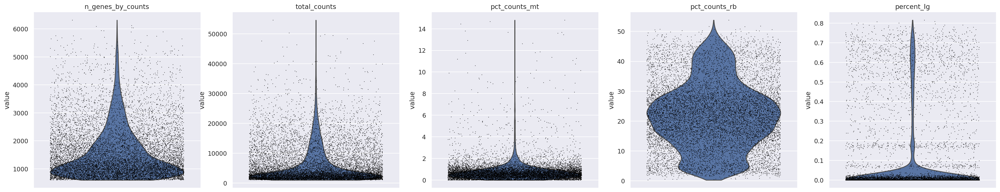

In [37]:
sc.pl.violin(adata[adata.obs['QC'] == 'Pass'], ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_rb', 'percent_Ig'], 
             jitter=0.4, multi_panel=True)

In [38]:
#Save RAW data matrix for further analysis (CellphoneDB, etc)
adata_raw = adata
adata_raw.write('/nfs/team205/rb29/mice_gutTCRtg_project/data/h5ad_objects/mice-gut.TCRtg/latest/mice4samplesPrepro_raw.h5ad')

## Filter based on the QC thresholds

In [39]:
adata=sc.read('/nfs/team205/rb29/mice_gutTCRtg_project/data/h5ad_objects/mice-gut.TCRtg/latest/mice4samplesPrepro_raw.h5ad')

In [40]:
adata = adata[adata.obs['QC'] == 'Pass']
adata

View of AnnData object with n_obs × n_vars = 11716 × 19330
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample',

## 2. Normalization and dimensionality reduction.

In [41]:
sc.settings.set_figure_params(dpi=80, facecolor='white', color_map='OrRd')

In [42]:
# Save the raw counts in a the layer 'counts'
adata.layers["counts"]=adata.X.copy()

In [43]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
adata

AnnData object with n_obs × n_vars = 11716 × 19330
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample', 'locati

### Cell cycle genes

Calculate cell cycle scores, as described [here](https://nbviewer.jupyter.org/github/theislab/scanpy_usage/blob/master/180209_cell_cycle/cell_cycle.ipynb). 

In [44]:
s_genes = ['Mcm5', 'Pcna', 'Tyms', 'Fen1', 'Mcm2', 'Mcm4', 'Rrm1', 'Ung', 'Gins2', 'Mcm6', 'Cdca7', 'Dtl', 'Prim1',
          'Uhrf1', 'Cenpu', 'Hells', 'Rfc2', 'Rpa2', 'Nasp', 'Rad51ap1', 'Gmnn', 'Wdr76', 'Slbp', 'Ccne2', 'Ubr7', 
          'Pold3', 'Msh2', 'Atad2', 'Rad51', 'Rrm2', 'Cdc45', 'Cdc6', 'Exo1', 'Tipin', 'Dscc1', 'Blm', 'Casp8ap2',
          'Usp1', 'Clspn', 'Pola1', 'Chaf1b', 'Brip1', 'E2f8']


g2m_genes =['Hmgb2', 'Cdk1', 'Nusap1', 'Ube2c', 'Birc5', 'Tpx2', 'Top2a', 'Ndc80', 'Cks2', 'Nuf2', 'Cks1b',
            'Cks1brt', 'Mki67', 'Tmpo', 'Cenpf', 'Tacc3', 'Pimreg', 'Smc4', 'Ccnb2', 'Ckap2l', 'Ckap2', 'Aurkb','Bub1',
            'Kif11', 'Anp32e', 'Tubb4b', 'Gtse1', 'Kif20b', 'Hjurp', 'Cdca3', 'Cdc20', 'Ttk', 'Cdc25c',
            'Kif2c', 'Rangap1', 'Ncapd2', 'Dlgap5', 'Cdca2', 'Cdca8', 'Ect2', 'Kif23', 'Hmmr', 'Aurka', 'Psrc1',
            'Anln', 'Lbr', 'Ckap5', 'Cenpe', 'Ctcf', 'Nek2', 'G2e3', 'Gas2l3', 'Cbx5', 'Cenpa']

cell_cycle_genes = s_genes + g2m_genes
display(len(s_genes))
display(len(g2m_genes))
display(len(cell_cycle_genes))

43

54

97

In [45]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in adata.var_names]
len(cell_cycle_genes)

96

In [46]:
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


In [47]:
# Identify highly-variable genes:
sc.pp.highly_variable_genes(adata, min_mean=0.0125, max_mean=3, min_disp=0.5)

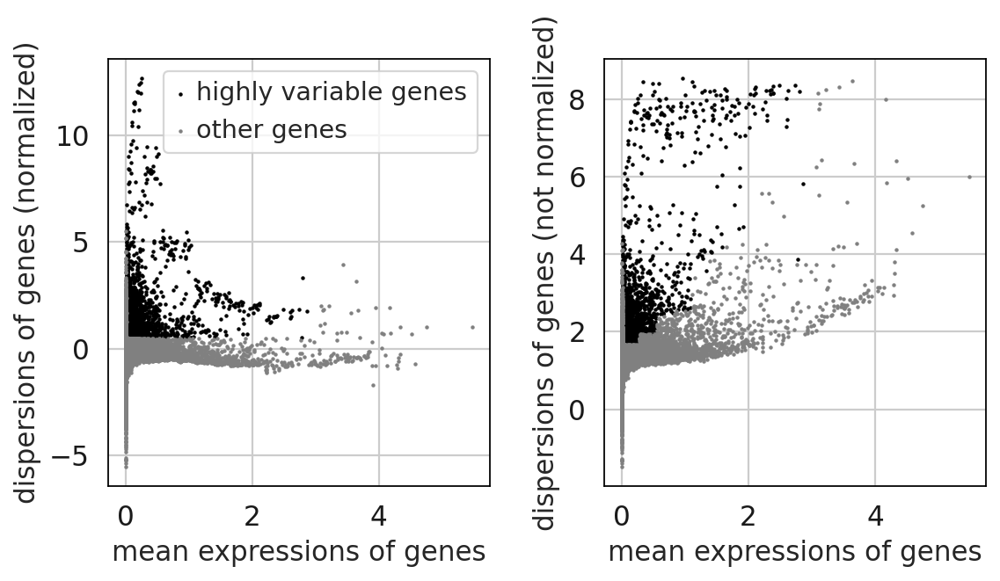

In [48]:
sc.pl.highly_variable_genes(adata)

In [49]:
# Save the total genes in adata.raw:
adata.raw = adata

In [50]:
adata.var.highly_variable.value_counts()

False    17336
True      1994
Name: highly_variable, dtype: int64

Filter the genes, only keeping the most variable ones:

In [51]:
adata = adata[:, adata.var.highly_variable]
adata

View of AnnData object with n_obs × n_vars = 11716 × 1994
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample', 

Regress out the effects of total counts, mt-genes, Ig-genes and cell cycle genes 

In [52]:
sc.pp.regress_out(adata, ['total_counts', 'pct_counts_mt', 'S_score', 'G2M_score', 'percent_Ig'])

/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/anndata/_core/anndata.py:1235: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  df[key] = c
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,
/home/jovyan/my-conda-envs/myenv/lib/python3.8/site-packages/statsmodels/tsa/base/tsa_model.py:7: FutureWarning: pandas.Float64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import (to_datetime, Int64Index, DatetimeIndex, Period,


In [53]:
sc.pp.scale(adata, max_value=10)

## 3. PCA and clustering of the cleaned data

In [54]:
sc.tl.pca(adata, svd_solver='arpack')

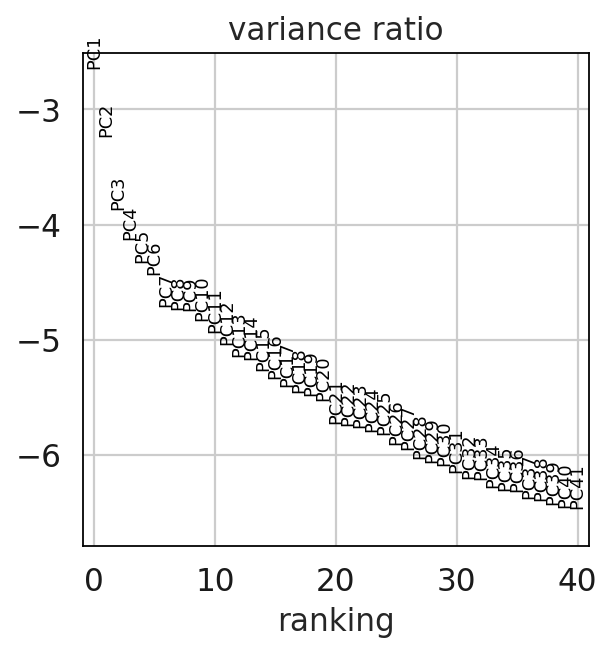

In [55]:
sc.pl.pca_variance_ratio(adata, log=True,n_pcs=40)

In [56]:
seed = 20
np.random.seed(seed)

In [57]:
sc.pp.neighbors(adata, n_neighbors=15, n_pcs=21)
sc.tl.umap(adata)

In [58]:
sc.tl.leiden(adata, resolution = 0.5)

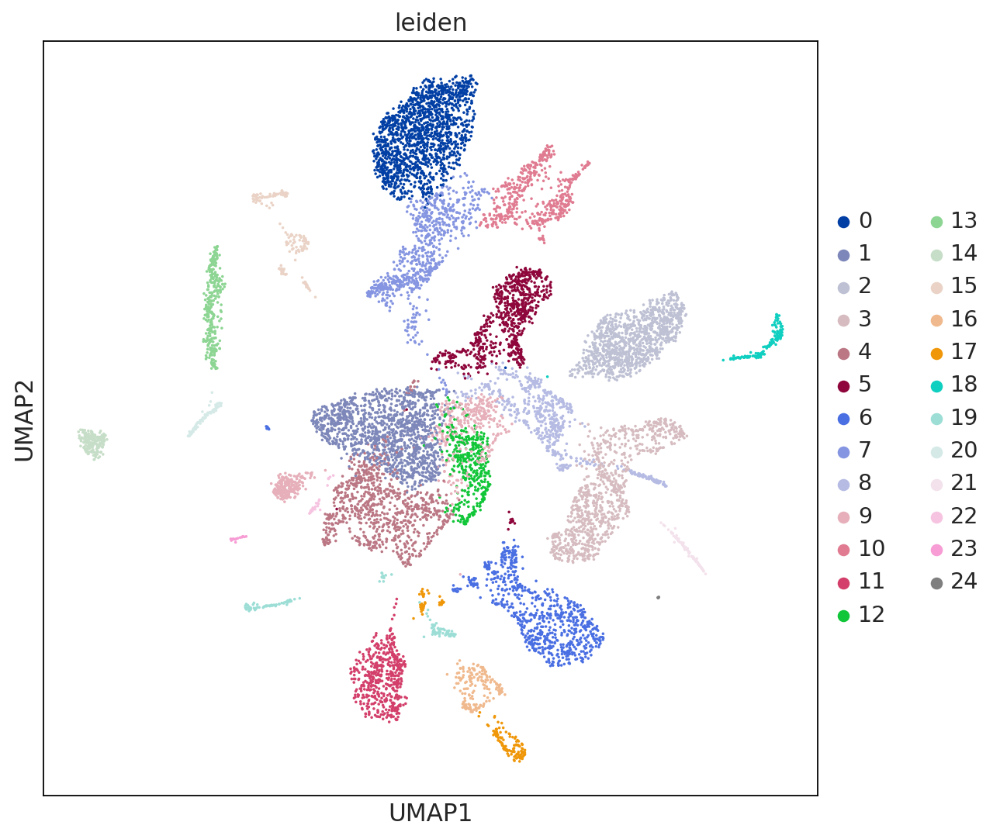

In [59]:
with mpl.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'])

In [60]:
sc.tl.paga(adata)
sc.pl.paga(adata, plot=False)  # remove `plot=False` if you want to see the coarse-grained graph
sc.tl.umap(adata, init_pos='paga')

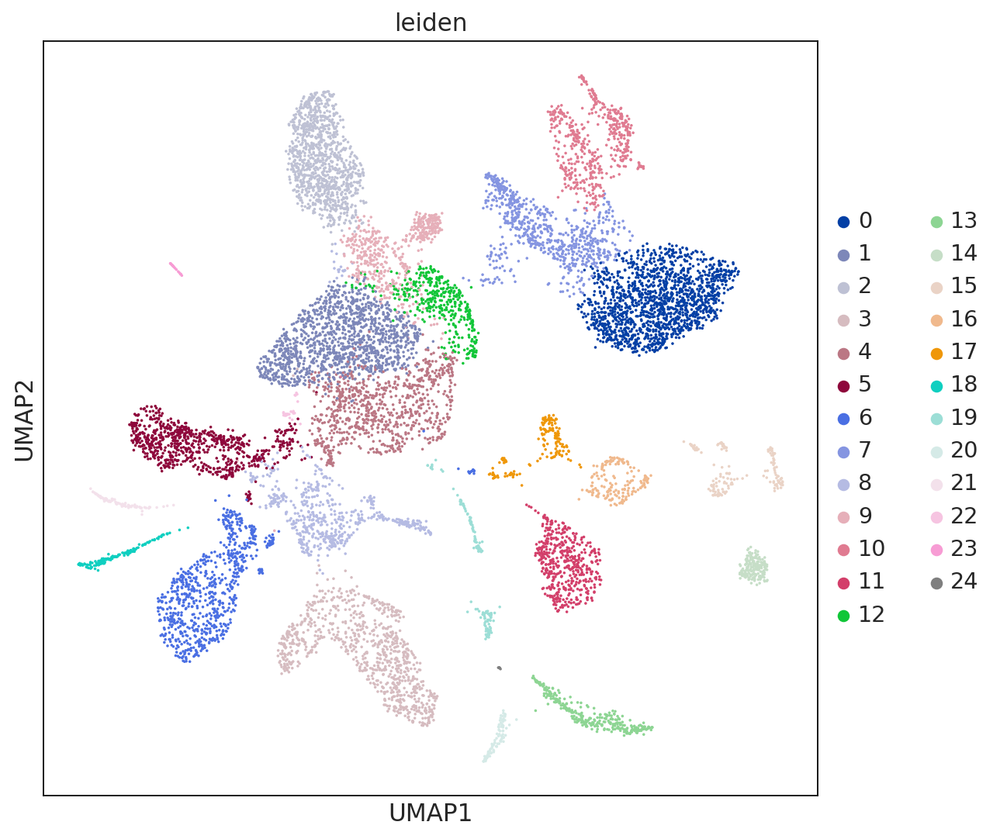

In [61]:
with mpl.rc_context({'figure.figsize': (8, 8)}):
    sc.pl.umap(adata, color=['leiden'])

In [62]:
adata

AnnData object with n_obs × n_vars = 11716 × 1994
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'sample', 'locatio

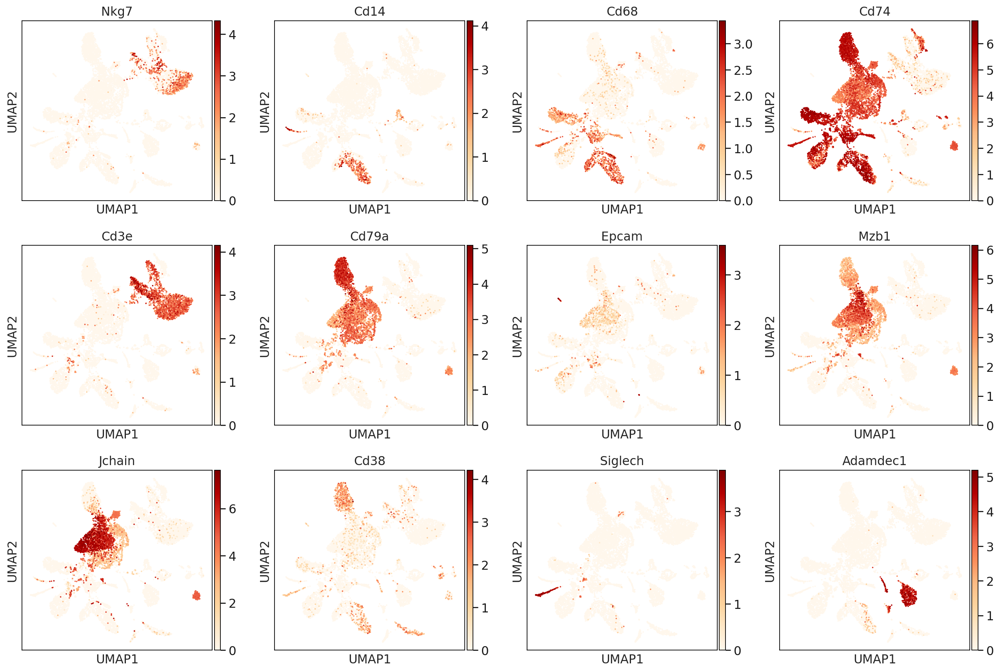

In [63]:
sc.pl.umap(adata, color=['Nkg7','Cd14','Cd68','Cd74','Cd3e','Cd79a','Epcam','Mzb1', 'Jchain','Cd38','Siglech', 'Adamdec1'], ncols = 4)

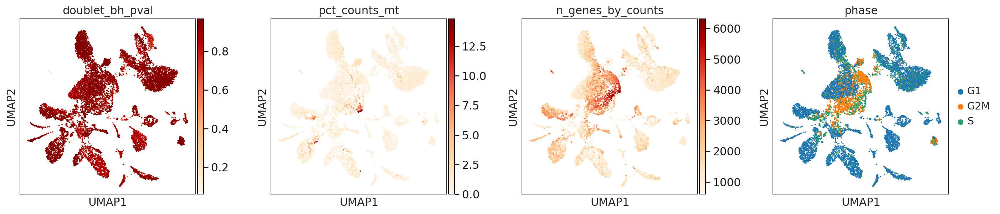

In [64]:
sc.pl.umap(adata, color=['doublet_bh_pval','pct_counts_mt','n_genes_by_counts','phase'], wspace=0.3)

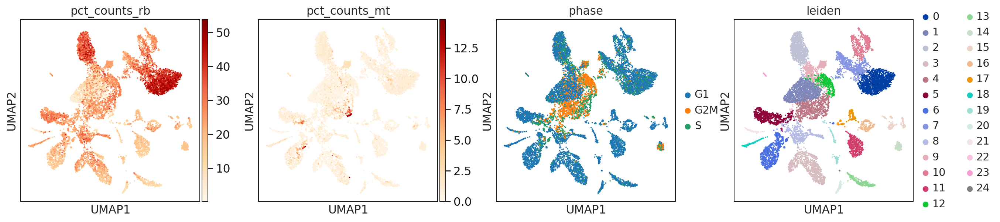

In [65]:
sc.pl.umap(adata, color=['pct_counts_rb','pct_counts_mt','phase','leiden'])

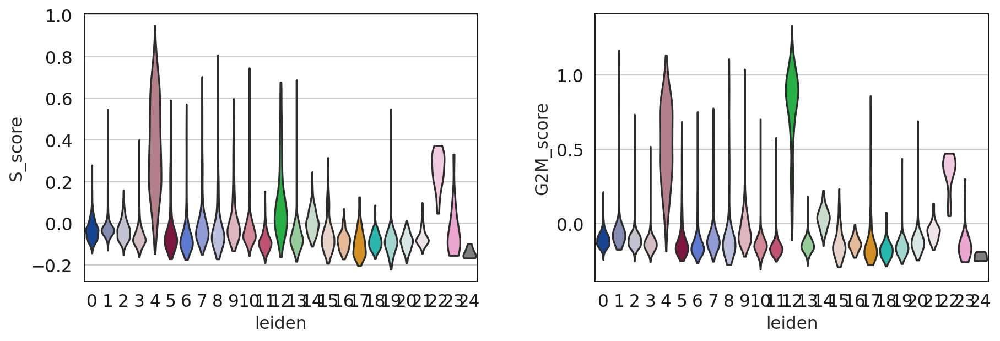

In [66]:
with mpl.rc_context({'figure.figsize': (5.5, 4)}):
    sc.pl.violin(adata, ['S_score','G2M_score'], groupby = 'leiden', stripplot = False)

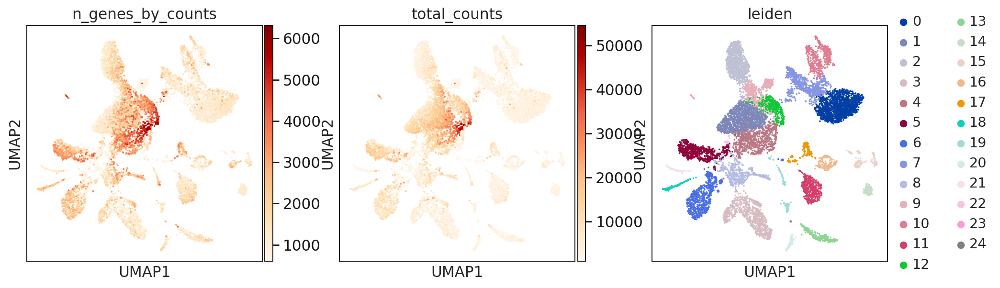

In [67]:
sc.pl.umap(adata, color=['n_genes_by_counts','total_counts','leiden'])

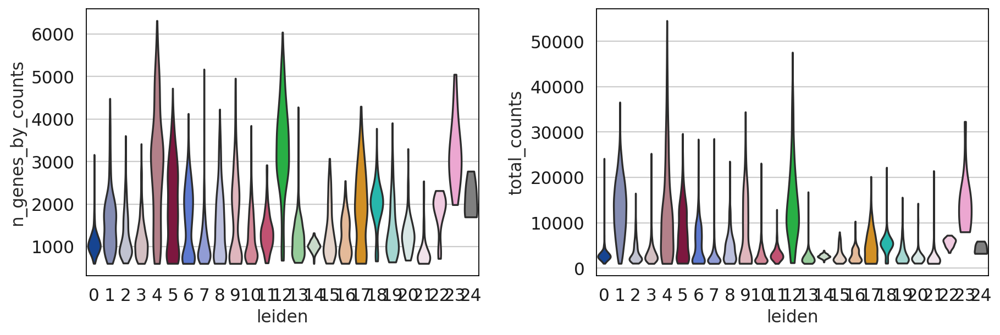

In [68]:
with mpl.rc_context({'figure.figsize': (5.5, 4)}):
    sc.pl.violin(adata, ['n_genes_by_counts','total_counts'], groupby = 'leiden', stripplot = False)

In [69]:
adata.obs['leiden'].value_counts()

0     1505
1     1312
2     1054
3      862
4      833
5      744
6      744
7      720
8      559
9      520
10     506
11     476
12     389
13     312
14     188
15     166
16     165
17     158
18     140
19     140
20      92
21      81
22      25
23      18
24       7
Name: leiden, dtype: int64

In [70]:
results_file='/nfs/team205/rb29/mice_gutTCRtg_project/data/h5ad_objects/mice-gut.TCRtg/latest/mice4samplesPrepro.h5ad'

In [71]:
adata.write(results_file)

---